## Importing libraries

In [1]:
import os
import pandas as pd
import numpy as np
import requests
from urllib.parse import urlparse
import random
import shutil
from pathlib import Path
import cv2
import glob
import xml.etree.ElementTree as ET
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import load_model

## Define a function to download images from a CSV file

In [2]:
def download_images_from_csv(csv_path):
    """
    Downloads images from a CSV file's 'image_url' column and saves them to an 'images' folder
    in the same directory as the CSV file. Ensures filenames are unique to prevent overwriting.

    Parameters:
        csv_path (str): Path to the input CSV file containing the 'image_url' column.
    """
    # Load the CSV file
    df = pd.read_csv(csv_path)

    # Determine and create the output 'images' directory
    csv_dir = os.path.dirname(csv_path)
    output_dir = os.path.join(csv_dir, 'images')
    os.makedirs(output_dir, exist_ok=True)

    # Download and save each image with a unique filename
    for i, url in enumerate(df['image_url']):
        try:
            response = requests.get(url, timeout=10)
            response.raise_for_status()  # Raise an error on bad status codes

            # Get original filename extension or use .jpg
            parsed_url = urlparse(url)
            original_name = os.path.basename(parsed_url.path)
            ext = os.path.splitext(original_name)[1] if '.' in original_name else '.jpg'

            # Generate a unique filename using the row index
            filename = f'image_{i}{ext}'
            filepath = os.path.join(output_dir, filename)

            with open(filepath, 'wb') as f:
                f.write(response.content)

            print(f'Downloaded: {filename}')
        except Exception as e:
            print(f'Error downloading image at row {i} ({url}): {e}')


## Define a function to scan csv files in a folder and download images.

In [3]:
def process_all_species(base_path):
    """
    Walks through each species folder in the base path, finds the CSV file,
    and downloads images using the download_images_from_csv function,
    unless an 'images' folder already exists in the same directory.

    Parameters:
        base_path (str): Path to the directory containing species subfolders.
    """
    for species_name in os.listdir(base_path):
        species_folder = os.path.join(base_path, species_name)
        if os.path.isdir(species_folder):
            # Find the CSV file in the species folder
            csv_files = [f for f in os.listdir(species_folder) if f.endswith('.csv')]
            if csv_files:
                csv_path = os.path.join(species_folder, csv_files[0])
                images_folder = os.path.join(species_folder, 'images')
                if os.path.exists(images_folder):
                    print(f'Skipping {species_name} (images folder already exists).')
                    continue
                print(f'Processing {species_name}...')
                download_images_from_csv(csv_path)
            else:
                print(f'No CSV found in {species_folder}')


## Download fire ant images

In [8]:
download_images_from_csv('Dataset/FireAnt/fireant.csv')

C:\Users\jsmeg\AppData\Local\Temp\ipykernel_11176\3986469211.py:10: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


Downloaded: image_0.jpg
Downloaded: image_1.JPG
Downloaded: image_2.JPG
Downloaded: image_3.jpg
Downloaded: image_4.jpg
Downloaded: image_5.JPG
Downloaded: image_6.jpg
Downloaded: image_7.jpg
Downloaded: image_8.jpg
Downloaded: image_9.jpg
Downloaded: image_10.jpg
Downloaded: image_11.jpg
Downloaded: image_12.jpg
Downloaded: image_13.jpg
Downloaded: image_14.jpg
Downloaded: image_15.jpg
Downloaded: image_16.JPG
Downloaded: image_17.jpg
Downloaded: image_18.JPG
Downloaded: image_19.JPG
Downloaded: image_20.jpg
Downloaded: image_21.JPG
Downloaded: image_22.JPG
Downloaded: image_23.JPG
Downloaded: image_24.JPG
Downloaded: image_25.JPG
Downloaded: image_26.jpg
Downloaded: image_27.jpg
Downloaded: image_28.jpg
Downloaded: image_29.jpg
Downloaded: image_30.jpg
Downloaded: image_31.JPG
Downloaded: image_32.jpg
Downloaded: image_33.jpg
Downloaded: image_34.jpg
Downloaded: image_35.jpg
Downloaded: image_36.JPG
Downloaded: image_37.JPG
Downloaded: image_38.jpg
Downloaded: image_39.jpg
Downloaded

## Download images of the most common ants in Japan

In [ ]:
process_all_species('Dataset/Native/MostCommon')

Skipping Ameiroari (images folder already exists).
Skipping Amimeari (images folder already exists).
Skipping Ashinagaari (images folder already exists).
Processing Azumaoozuari...
Downloaded: image_0.jpg
Downloaded: image_1.jpeg
Downloaded: image_2.jpeg
Downloaded: image_3.jpeg
Downloaded: image_4.jpeg
Downloaded: image_5.jpeg
Downloaded: image_6.jpeg
Downloaded: image_7.jpeg
Downloaded: image_8.jpg
Downloaded: image_9.jpeg
Downloaded: image_10.jpg
Downloaded: image_11.jpeg
Downloaded: image_12.jpg
Downloaded: image_13.png
Downloaded: image_14.jpg
Downloaded: image_15.jpeg
Downloaded: image_16.png
Downloaded: image_17.png
Downloaded: image_18.jpg
Downloaded: image_19.jpeg
Downloaded: image_20.jpeg
Downloaded: image_21.jpeg
Downloaded: image_22.jpeg
Downloaded: image_23.jpeg
Downloaded: image_24.jpeg
Downloaded: image_25.jpeg
Downloaded: image_26.jpeg
Downloaded: image_27.jpeg
Downloaded: image_28.jpeg
Downloaded: image_29.jpeg
Downloaded: image_30.jpeg
Downloaded: image_31.jpeg
Downlo

: 

## Download images of common ants in Japan

In [4]:
process_all_species('Dataset/Native/Common')

Skipping Akayamaari (images folder already exists).
Skipping Ameirokeari (images folder already exists).
Skipping Ezoakayamaari (images folder already exists).
Skipping Ezokushikeari (images folder already exists).
Skipping Fushibosokusaari (images folder already exists).
Skipping Harinagamunebosoari (images folder already exists).
Skipping Hayashikeari (images folder already exists).
Skipping Hayashikuroyamaari (images folder already exists).
Skipping Higenagaameirokeari (images folder already exists).
Skipping Higenagakeari (images folder already exists).
Skipping Himeari (images folder already exists).
Skipping Himehariari (images folder already exists).
Skipping Iehimeari (images folder already exists).
Skipping Itoooari (images folder already exists).
Skipping Kadofushiari (images folder already exists).
Skipping Kitaurokoari (images folder already exists).
Skipping Kurokusaari (images folder already exists).
Skipping Kuronisehariari (images folder already exists).
Skipping Kusaar

## Download images of rare ants in Japan

In [5]:
process_all_species('Dataset/Native/Rare')

Processing Ameiroooari...
Downloaded: image_0.jpeg
Downloaded: image_1.jpeg
Downloaded: image_2.jpeg
Downloaded: image_3.jpeg
Downloaded: image_4.jpg
Downloaded: image_5.jpeg
Downloaded: image_6.jpeg
Downloaded: image_7.jpeg
Downloaded: image_8.jpeg
Downloaded: image_9.jpeg
Processing Hayashimunebosoari...
Downloaded: image_0.jpeg
Downloaded: image_1.jpg
Downloaded: image_2.jpg
Downloaded: image_3.jpg
Processing Himekiirokeari...
Downloaded: image_0.jpeg
Downloaded: image_1.jpg
Downloaded: image_2.jpeg
Downloaded: image_3.jpg
Downloaded: image_4.jpg
Downloaded: image_5.jpeg
Downloaded: image_6.jpg
Processing Himeoozuari...
Downloaded: image_0.jpeg
Downloaded: image_1.jpg
Downloaded: image_2.jpg
Downloaded: image_3.jpg
Downloaded: image_4.jpg
Downloaded: image_5.jpg
Downloaded: image_6.jpg
Downloaded: image_7.jpg
Downloaded: image_8.jpg
Downloaded: image_9.jpeg
Downloaded: image_10.jpeg
Downloaded: image_11.jpg
Downloaded: image_12.jpeg
Downloaded: image_13.jpeg
Downloaded: image_14.png

## Download images of extremely rare ants in Japan

In [6]:
process_all_species('Dataset/Native/ExtremelyRare')

Processing Awatekonukaari...
Downloaded: image_0.jpg
Downloaded: image_1.jpg
Downloaded: image_2.jpg
Downloaded: image_3.jpg
Downloaded: image_4.JPG
Downloaded: image_5.jpg
Downloaded: image_6.jpg
Downloaded: image_7.jpg
Downloaded: image_8.jpg
Downloaded: image_9.jpg
Downloaded: image_10.jpeg
Downloaded: image_11.jpg
Downloaded: image_12.jpg
Downloaded: image_13.JPG
Downloaded: image_14.jpg
Downloaded: image_15.jpg
Downloaded: image_16.jpg
Downloaded: image_17.jpeg
Downloaded: image_18.jpeg
Downloaded: image_19.jpg
Downloaded: image_20.jpeg
Downloaded: image_21.jpeg
Downloaded: image_22.jpeg
Downloaded: image_23.jpg
Downloaded: image_24.jpg
Downloaded: image_25.jpg
Downloaded: image_26.jpg
Downloaded: image_27.jpeg
Downloaded: image_28.jpg
Downloaded: image_29.jpeg
Downloaded: image_30.jpg
Downloaded: image_31.jpg
Downloaded: image_32.jpg
Downloaded: image_33.jpg
Downloaded: image_34.jpeg
Downloaded: image_35.jpg
Downloaded: image_36.jpg
Downloaded: image_37.jpg
Downloaded: image_38.j

## Define a function to filter low-quality images

In [6]:
def prefilter_images_by_quality(folder_path, min_size=(100, 100), min_blur=30, dark_thresh=10, bright_thresh=245):
    """
    Filters jpg/jpeg images in a folder using basic heuristics (size, brightness, blur),
    and moves poor quality images to a "PoorQualityImages" folder one level above.
    """
    folder = Path(folder_path)
    poor_quality_dir = folder.parent / "PoorQualityImages"
    poor_quality_dir.mkdir(exist_ok=True)

    # Supported extensions
    extensions = ('.jpg', '.jpeg')

    for img_path in folder.glob("*"):
        if img_path.suffix.lower() not in extensions:
            continue

        try:
            img = cv2.imread(str(img_path))
            if img is None:
                raise ValueError("Unreadable image")

            # Check resolution
            h, w = img.shape[:2]
            if h < min_size[1] or w < min_size[0]:
                shutil.move(str(img_path), poor_quality_dir / img_path.name)
                continue

            # Brightness check
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            mean_intensity = np.mean(gray)
            if mean_intensity < dark_thresh or mean_intensity > bright_thresh:
                shutil.move(str(img_path), poor_quality_dir / img_path.name)
                continue

            # Blur check using Laplacian variance
            blur_score = cv2.Laplacian(gray, cv2.CV_64F).var()
            if blur_score < min_blur:
                shutil.move(str(img_path), poor_quality_dir / img_path.name)

        except Exception as e:
            print(f"Skipping {img_path.name}: {e}")
            continue

    print(f"Pre-filtering complete. Poor quality images moved to: {poor_quality_dir}")


## Filtering low-quality images

In [7]:
dataset_path = Path("Dataset")

# 1. FireAnt/images
fireant_images = dataset_path / "FireAnt" / "images"
if fireant_images.exists():
    prefilter_images_by_quality(fireant_images)

# 2. Native/{MostCommon, Common, Rare, ExtremelyRare}/*/images
native_root = dataset_path / "Native"
for category in ["MostCommon", "Common", "Rare", "ExtremelyRare"]:
    category_path = native_root / category
    if category_path.exists():
        for species_folder in category_path.iterdir():
            images_folder = species_folder / "images"
            if images_folder.exists():
                prefilter_images_by_quality(images_folder)

# 3. Unused/{Cutoff, SmallSamples}/{MostCommon, Common, Rare, ExtremelyRare}/*/images
unused_root = dataset_path / "Unused"
for unused_type in ["Cutoff", "SmallSamples"]:
    for category in ["MostCommon", "Common", "Rare", "ExtremelyRare"]:
        base_path = unused_root / unused_type / category
        if base_path.exists():
            for species_folder in base_path.iterdir():
                images_folder = species_folder / "images"
                if images_folder.exists():
                    prefilter_images_by_quality(images_folder)


Pre-filtering complete. Poor quality images moved to: Dataset\FireAnt\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Ameiroari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Amimeari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Azumaoozuari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Haributoshiriageari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Kiirokeari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Kiiroshiriageari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Kuronagaari\PoorQualityImages
Pre-filtering complete. Poor quality images moved to: Dataset\Native\MostCommon\Kuroooari\PoorQualityImages
Pre-filtering complete. Po

## Create a model that extracts only images containing ants from the dataset.

### 1) Model creation

In [5]:
# Parameters
BATCH_SIZE = 32
IMG_SIZE = (224, 224)
SEED = 123

# Dataset loading
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory='Dataset/ForFiltering',
    labels='inferred',
    label_mode='binary',
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    directory='Dataset/ForFiltering',
    labels='inferred',
    label_mode='binary',
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# Check label mapping
print("Class names:", train_ds.class_names)

# Prefetch for performance
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

# Data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Preprocessing layer (EfficientNet expects [-1, 1])
preprocess_input = tf.keras.applications.efficientnet.preprocess_input

# Base model
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False

# Model building
inputs = keras.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(1, activation='sigmoid')(x)
model = keras.Model(inputs, outputs)

# Compile
model.compile(
    optimizer=keras.optimizers.Adam(),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=[early_stop]
)

model.save("ant_detection_model.keras")

Found 1000 files belonging to 2 classes.
Using 800 files for training.
Found 1000 files belonging to 2 classes.
Using 200 files for validation.
Class names: ['Ants', 'NoAnts']
Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 20s 596ms/step - accuracy: 0.8715 - loss: 0.4362 - val_accuracy: 1.0000 - val_loss: 0.1091
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 519ms/step - accuracy: 0.9823 - loss: 0.1259 - val_accuracy: 0.9950 - val_loss: 0.0502
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 530ms/step - accuracy: 0.9856 - loss: 0.0750 - val_accuracy: 0.9950 - val_loss: 0.0349
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 562ms/step - accuracy: 0.9913 - loss: 0.0557 - val_accuracy: 0.9950 - val_loss: 0.0280
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 759ms/step - accuracy: 0.9890 - loss: 0.0428 - val_accuracy: 0.9950 - val_loss: 0.0246
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 777ms/step - accuracy: 0.9989 - loss: 0.0371 - val_accuracy: 0.9950 - val_loss: 0.0215
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 771ms/st

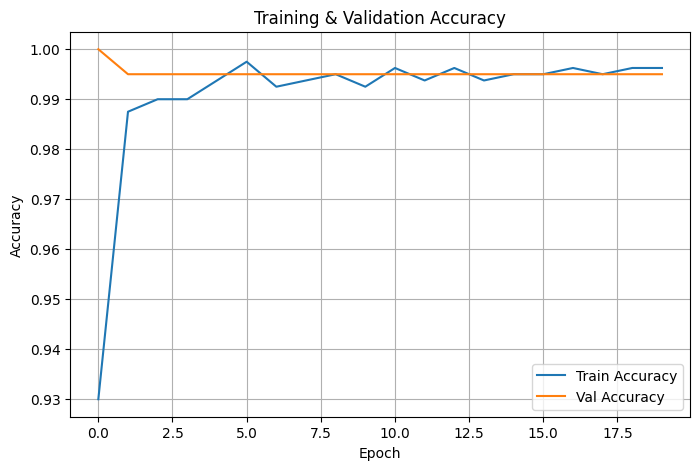

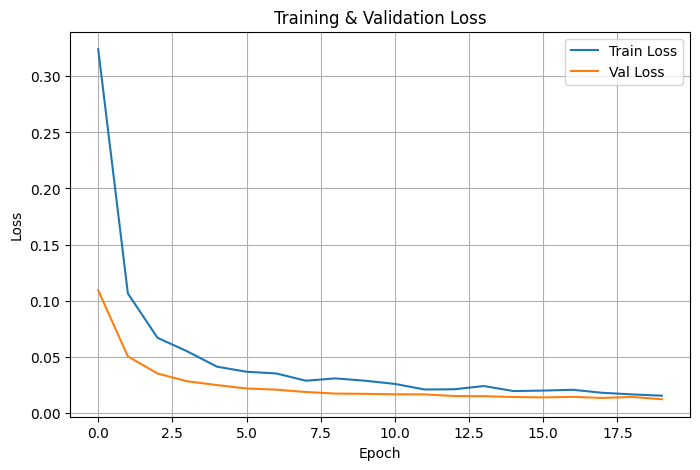

In [6]:
# Plot Accuracy
plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

### 2) Define a function to filter images using the above model.

In [2]:
def filter_non_ant_images(model, folder_path, img_size=(224, 224), threshold=0.5):
    """
    Uses a trained binary classifier to move images without ants to 'NoAntsImages'.

    Parameters:
    - model: Trained Keras model.
    - folder_path: Path to the folder containing images.
    - img_size: Tuple indicating image size for resizing.
    - threshold: Classification threshold (default: 0.5).
    """
    folder = Path(folder_path)
    no_ant_dir = folder.parent / "NoAntsImages"
    no_ant_dir.mkdir(exist_ok=True)

    for img_file in folder.glob("*"):
        if img_file.suffix.lower() not in ['.jpg', '.jpeg']:
            continue
        try:
            img = image.load_img(img_file, target_size=img_size)
            img_array = image.img_to_array(img)
            img_array = preprocess_input(img_array)
            img_array = np.expand_dims(img_array, axis=0)

            pred = model.predict(img_array)[0][0]

            if pred >= threshold:
                shutil.move(str(img_file), no_ant_dir / img_file.name)
                print(f"Moved: {img_file.name} (Predicted: {pred:.2f})")

        except Exception as e:
            print(f"Error processing {img_file.name}: {e}")

    print(f"Filtering complete. Non-ant images moved to: {no_ant_dir}")


### 3) Apply the above filtering to all image files.

In [3]:
def apply_filter_to_all_images_folders(model, base_dir, img_size=(224, 224), threshold=0.5):
    """
    Recursively searches for 'images' folders under base_dir and applies the filtering function.
    
    Parameters:
    - model: Trained Keras model.
    - base_dir: Root path (e.g., 'Dataset').
    - img_size: Size to resize images to before prediction.
    - threshold: Probability threshold above which the image is classified as 'No Ant'.
    """
    base_path = Path(base_dir)

    for images_dir in base_path.rglob("images"):
        if images_dir.is_dir():
            print(f"\nProcessing folder: {images_dir}")
            filter_non_ant_images(model, images_dir, img_size=img_size, threshold=threshold)


In [10]:
apply_filter_to_all_images_folders(model, base_dir="Dataset", img_size=(224, 224), threshold=0.8)


Processing folder: Dataset\FireAnt\images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Moved: image_10000.jpeg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Moved: image_10001.jpg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Moved: image_10002.jpeg (Predicted: 0.99)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Moved: image_10003.jpg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Moved: image_10004.jpeg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Moved: image_10006.jpg (Predicted: 0.94)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Moved: image_10009.jpeg (Predicted: 0.93)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Moved: image_10010.jpeg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Moved: image_10011.jpeg (Predicted: 1.00)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Moved: image_10012.jpeg (Predicted: 0.99)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Moved: i

## Create higher quality datasets by adjusting thresholds

In [4]:
model = tf.keras.models.load_model("ant_detection_model.keras")

In [5]:
apply_filter_to_all_images_folders(model, base_dir="Dataset/HighQualityImages", img_size=(224, 224), threshold=0.2)


Processing folder: Dataset\HighQualityImages\FireAnt\images
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Moved: image_10062.jpeg (Predicted: 0.22)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Moved: image_10065.jpg (Predicted: 0.49)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Moved: image_101.jpg (

In [6]:
apply_filter_to_all_images_folders(model, base_dir="Dataset/HighQualityUnusedImages", img_size=(224, 224), threshold=0.2)


Processing folder: Dataset\HighQualityUnusedImages\SmallSamples\Common\Ameirokeari\images
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Moved: image_0.JPG (Predicted: 0.40)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/ste

## Define a function to extract 500 images from images of species with a large number of samples.

In [4]:
def split_images(folder_path):
    folder_path = Path(folder_path)
    if not folder_path.is_dir():
        raise ValueError("Provided path must be a directory.")

    # Find all .jpg and .jpeg files (case-insensitive)
    image_files = [f for f in folder_path.iterdir()
                   if f.is_file() and f.suffix.lower() in ['.jpg', '.jpeg']]

    if len(image_files) < 500:
        raise ValueError("Not enough image files to select 500 samples.")

    # Randomly select 500 files
    selected_500 = random.sample(image_files, 500)

    # Determine remaining files
    remaining_files = [f for f in image_files if f not in selected_500]

    # Create output folders one level above the original folder
    parent_dir = folder_path.parent
    selected_dir = parent_dir / "selected_500"
    remaining_dir = parent_dir / "remaining"

    selected_dir.mkdir(exist_ok=True)
    remaining_dir.mkdir(exist_ok=True)

    # Copy files to respective folders
    for f in selected_500:
        shutil.copy2(f, selected_dir / f.name)

    for f in remaining_files:
        shutil.copy2(f, remaining_dir / f.name)

    print(f"Copied 500 files to '{selected_dir}' and {len(remaining_files)} files to '{remaining_dir}'.")


## Extract 500 images from images of species with a large number of samples.

In [5]:
# List of image folder paths
folders = [
    "Dataset/Native/MostCommon/Oohariari/images",
    "Dataset/Native/MostCommon/Amimeari/images",
    "Dataset/Native/MostCommon/Ameiroari/images",
    "Dataset/Native/MostCommon/Kiirokeari/images",
    "Dataset/Native/MostCommon/Kuroyamaari/images",
    "Dataset/Native/MostCommon/Kuroooari/images",
    "Dataset/Native/Common/Akayamaari/images",
    "Dataset/Native/Rare/Ruriari/images",
    "Dataset/Native/Rare/Karafutokuroooari/images",
    "Dataset/Native/ExtremelyRare/Awatekonukaari/images",
    "Dataset/Native/ExtremelyRare/Higenagaameiroari/images",
    "Dataset/Native/ExtremelyRare/Ooshiwaari/images",
]

# Run split on each folder
for folder in folders:
    try:
        split_images(folder)
    except Exception as e:
        print(f"Error processing '{folder}': {e}")

Copied 500 files to 'Dataset\Native\MostCommon\Oohariari\selected_500' and 1995 files to 'Dataset\Native\MostCommon\Oohariari\remaining'.
Copied 500 files to 'Dataset\Native\MostCommon\Amimeari\selected_500' and 165 files to 'Dataset\Native\MostCommon\Amimeari\remaining'.
Copied 500 files to 'Dataset\Native\MostCommon\Ameiroari\selected_500' and 2102 files to 'Dataset\Native\MostCommon\Ameiroari\remaining'.
Copied 500 files to 'Dataset\Native\MostCommon\Kiirokeari\selected_500' and 802 files to 'Dataset\Native\MostCommon\Kiirokeari\remaining'.
Copied 500 files to 'Dataset\Native\MostCommon\Kuroyamaari\selected_500' and 207 files to 'Dataset\Native\MostCommon\Kuroyamaari\remaining'.
Copied 500 files to 'Dataset\Native\MostCommon\Kuroooari\selected_500' and 803 files to 'Dataset\Native\MostCommon\Kuroooari\remaining'.
Copied 500 files to 'Dataset\Native\Common\Akayamaari\selected_500' and 658 files to 'Dataset\Native\Common\Akayamaari\remaining'.
Copied 500 files to 'Dataset\Native\Rare\

## To avoid duplicate image file names, rename the image files with sequential numbers.

In [2]:
def rename_images_sequentially(base_dir, prefix="image_learning"):
    base_path = Path(base_dir)
    counter = 1

    for image_folder in base_path.rglob("images"):
        if image_folder.is_dir():
            for img_file in sorted(image_folder.glob("*")):
                if img_file.suffix.lower() in ['.jpg', '.jpeg']:
                    new_name = f"{prefix}_{counter}{img_file.suffix.lower()}"
                    new_path = img_file.with_name(new_name)
                    
                    try:
                        img_file.rename(new_path)
                        print(f"Renamed: {img_file.name} → {new_name}")
                        counter += 1
                    except Exception as e:
                        print(f"Error renaming {img_file}: {e}")

    print(f"\nRenaming complete. Total images renamed: {counter - 1}")

rename_images_sequentially("Dataset/ForLearning/Native")


Renamed: 03.jpg → image_learning_1.jpg
Renamed: 19.jpg → image_learning_2.jpg
Renamed: 20.jpg → image_learning_3.jpg
Renamed: 21.jpg → image_learning_4.jpg
Renamed: 70.jpg → image_learning_5.jpg
Renamed: 71.jpg → image_learning_6.jpg
Renamed: 72.jpg → image_learning_7.jpg
Renamed: image_0.jpg → image_learning_8.jpg
Renamed: image_1.JPG → image_learning_9.jpg
Renamed: image_10.jpeg → image_learning_10.jpeg
Renamed: image_100.jpeg → image_learning_11.jpeg
Renamed: image_1000.jpeg → image_learning_12.jpeg
Renamed: image_1009.jpg → image_learning_13.jpg
Renamed: image_101.jpeg → image_learning_14.jpeg
Renamed: image_1010.jpg → image_learning_15.jpg
Renamed: image_1012.jpeg → image_learning_16.jpeg
Renamed: image_1013.jpg → image_learning_17.jpg
Renamed: image_1014.jpeg → image_learning_18.jpeg
Renamed: image_102.jpeg → image_learning_19.jpeg
Renamed: image_1020.jpg → image_learning_20.jpg
Renamed: image_1021.jpg → image_learning_21.jpg
Renamed: image_1025.jpg → image_learning_22.jpg
Rename

## Define functions for organizing image files

In [2]:
def copy_images_by_rarity(src_base_dir, dest_base_dir):
    src_base = Path(src_base_dir)
    dest_base = Path(dest_base_dir)

    rarity_levels = ['MostCommon', 'Common', 'Rare', 'ExtremelyRare']
    all_folder = dest_base / "All"
    most_common_and_common_folder = dest_base / "MostCommonAndCommon"
    all_folder.mkdir(parents=True, exist_ok=True)
    most_common_and_common_folder.mkdir(parents=True, exist_ok=True)

    seen_paths = set()
    global_counter = 0

    for level in rarity_levels:
        src_folder = src_base / level
        dest_folder = dest_base / f"{level}All"
        dest_folder.mkdir(parents=True, exist_ok=True)

        level_counter = 0

        for species_folder in src_folder.iterdir():
            if species_folder.is_dir():
                images_folder = species_folder / "images"
                if images_folder.exists():
                    for ext in ["*.jpg", "*.jpeg"]:
                        for img_file in images_folder.glob(ext):
                            resolved_path = img_file.resolve()
                            if resolved_path in seen_paths:
                                continue  # Skip already copied image
                            seen_paths.add(resolved_path)

                            suffix = img_file.suffix.lower()
                            new_filename = f"{level}_{species_folder.name}_{global_counter:05d}{suffix}"

                            # Copy to individual rarity folder
                            shutil.copy(img_file, dest_folder / new_filename)

                            # Copy to All
                            shutil.copy(img_file, all_folder / new_filename)

                            # Copy to MostCommonAndCommon if applicable
                            if level in ['MostCommon', 'Common']:
                                shutil.copy(img_file, most_common_and_common_folder / new_filename)

                            global_counter += 1
                            level_counter += 1

        print(f"Copied {level_counter} unique images from '{level}' to '{dest_folder.name}'.")

    print(f"\nAll unique images copied to: {all_folder}")
    print(f"Unique images from MostCommon and Common copied to: {most_common_and_common_folder}")


In [3]:
copy_images_by_rarity("Dataset/Unused/SmallSamples", "Dataset/ForTest/Low")

Copied 376 unique images from 'MostCommon' to 'MostCommonAll'.
Copied 717 unique images from 'Common' to 'CommonAll'.
Copied 569 unique images from 'Rare' to 'RareAll'.
Copied 2 unique images from 'ExtremelyRare' to 'ExtremelyRareAll'.

All unique images copied to: Dataset\ForTest\Low\All
Unique images from MostCommon and Common copied to: Dataset\ForTest\Low\MostCommonAndCommon


In [4]:
copy_images_by_rarity("Dataset/MiddleQualityUnusedImages/SmallSamples", "Dataset/ForTest/Middle")

Copied 369 unique images from 'MostCommon' to 'MostCommonAll'.
Copied 693 unique images from 'Common' to 'CommonAll'.
Copied 551 unique images from 'Rare' to 'RareAll'.
Copied 2 unique images from 'ExtremelyRare' to 'ExtremelyRareAll'.

All unique images copied to: Dataset\ForTest\Middle\All
Unique images from MostCommon and Common copied to: Dataset\ForTest\Middle\MostCommonAndCommon


In [5]:
copy_images_by_rarity("Dataset/HighQualityUnusedImages/SmallSamples", "Dataset/ForTest/High")

Copied 351 unique images from 'MostCommon' to 'MostCommonAll'.
Copied 655 unique images from 'Common' to 'CommonAll'.
Copied 527 unique images from 'Rare' to 'RareAll'.
Copied 2 unique images from 'ExtremelyRare' to 'ExtremelyRareAll'.

All unique images copied to: Dataset\ForTest\High\All
Unique images from MostCommon and Common copied to: Dataset\ForTest\High\MostCommonAndCommon
